In [ ]:
import polars as pl
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

In [17]:
from pathlib import Path

# === Đường dẫn thư mục chứa các file parquet ===
base_path = Path(r"D:\recommendation dataset")

# === Tìm tất cả file parquet ===
all_parquet_files = list(base_path.glob("*.parquet"))
print(f"Tìm thấy {len(all_parquet_files)} file parquet trong thư mục.")

# === Phân loại file ===
sales_item_files = []
sales_purchase_files = []
sales_user_files = []

for file_path in all_parquet_files:
    name = file_path.name.lower()
    if "sales_pers.item" in name:
        sales_item_files.append(file_path)
    elif "sales_pers.purchase" in name or "sales_pers.purchase_history_daily" in name:
        sales_purchase_files.append(file_path)
    elif "sales_pers.user" in name:
        sales_user_files.append(file_path)

print(f"""
 Tổng kết:
   sales_pers.item: {len(sales_item_files)} files
   sales_pers.purchase: {len(sales_purchase_files)} files
   sales_pers.user: {len(sales_user_files)} files
""")

# === Đọc tất cả files của mỗi nhóm bằng Polars ===
def read_parquet_group(file_list, group_name):
    if not file_list:
        print(f"Không có file nào cho nhóm {group_name}")
        return None
    
    print(f"Đang đọc {len(file_list)} file(s) cho nhóm {group_name}...")
    
    # Polars cho phép đọc nhiều file cùng lúc chỉ bằng 1 dòng
    df = pl.read_parquet(file_list)
    
    print(f"{group_name} loaded: {df.shape[0]:,} rows × {df.shape[1]} columns")
    return df

sales_item_df = read_parquet_group(sales_item_files, "SALES ITEM")
sales_purchase_df = read_parquet_group(sales_purchase_files, "SALES PURCHASE")
sales_user_df = read_parquet_group(sales_user_files, "SALES USER")

# === Tổng kết ===
print("\nTỔNG KẾT DỮ LIỆU:")
if sales_item_df is not None:
    print(f"sales_item_df: {sales_item_df.shape}")
if sales_purchase_df is not None:
    print(f"sales_purchase_df: {sales_purchase_df.shape}")
if sales_user_df is not None:
    print(f"sales_user_df: {sales_user_df.shape}")

Tìm thấy 83 file parquet trong thư mục.

 Tổng kết:
   sales_pers.item: 1 files
   sales_pers.purchase: 72 files
   sales_pers.user: 10 files

Đang đọc 1 file(s) cho nhóm SALES ITEM...
SALES ITEM loaded: 27,332 rows × 34 columns
Đang đọc 72 file(s) cho nhóm SALES PURCHASE...
SALES PURCHASE loaded: 35,729,825 rows × 16 columns
Đang đọc 10 file(s) cho nhóm SALES USER...
SALES USER loaded: 4,573,964 rows × 18 columns

TỔNG KẾT DỮ LIỆU:
sales_item_df: (27332, 34)
sales_purchase_df: (35729825, 16)
sales_user_df: (4573964, 18)


EDA

PHẦN 1 — Tổng quan dữ liệu

In [18]:
datasets = {
    "SALES ITEM": sales_item_df,
    "SALES PURCHASE": sales_purchase_df,
    "SALES USER": sales_user_df
}

for name, df in datasets.items():
    if df is None:
        continue
    print(f"\n=== {name} ===")
    print(f"Shape: {df.shape[0]:,} rows × {df.shape[1]} columns")
    print("Columns:", df.columns)
    print("\n Missing values:")
    print(df.null_count().to_pandas().T)
    print("\nMô tả dữ liệu số:")
    display(df.describe())


=== SALES ITEM ===
Shape: 27,332 rows × 34 columns
Columns: ['p_id', 'item_id', 'price', 'category_l1_id', 'category_l1', 'category_l2_id', 'category_l2', 'category_l3_id', 'category_l3', 'category_id', 'category', 'description', 'brand', 'manufacturer', 'creation_timestamp', 'is_deleted', 'created_date', 'updated_date', 'sync_status_id', 'last_sync_date', 'sync_error_message', 'image_url', 'gender_target', 'age_group', 'item_type', 'gp', 'weight', 'color', 'size', 'origin', 'volume', 'material', 'sale_status', 'description_new']

 Missing values:
                        0
p_id                    0
item_id                 0
price                   0
category_l1_id          0
category_l1             0
category_l2_id          0
category_l2             0
category_l3_id          0
category_l3             0
category_id             0
category                0
description             0
brand                   0
manufacturer            0
creation_timestamp      0
is_deleted              0
cre

statistic,p_id,item_id,price,category_l1_id,category_l1,category_l2_id,category_l2,category_l3_id,category_l3,category_id,category,description,brand,manufacturer,creation_timestamp,is_deleted,created_date,updated_date,sync_status_id,last_sync_date,sync_error_message,image_url,gender_target,age_group,item_type,gp,weight,color,size,origin,volume,material,sale_status,description_new
str,f64,str,f64,f64,str,f64,str,f64,str,f64,str,str,str,str,f64,f64,str,str,f64,str,str,str,str,str,str,f64,f64,str,str,str,str,str,f64,str
"""count""",27332.0,"""27332""",27332.0,27332.0,"""27332""",27332.0,"""27332""",27332.0,"""27332""",27332.0,"""27332""","""27332""","""27332""","""27332""",27332.0,27332.0,"""27332""","""27332""",26546.0,"""26546""","""0""","""27332""","""27332""","""27332""","""27332""",27332.0,0.0,"""27332""","""27332""","""27332""","""27332""","""27332""",27332.0,"""22317"""
"""null_count""",0.0,"""0""",0.0,0.0,"""0""",0.0,"""0""",0.0,"""0""",0.0,"""0""","""0""","""0""","""0""",0.0,0.0,"""0""","""0""",786.0,"""786""","""27332""","""0""","""0""","""0""","""0""",0.0,27332.0,"""0""","""0""","""0""","""0""","""0""",0.0,"""5015"""
"""mean""",106317.679643,null,190456.829467,2836.189192,null,3719.039843,null,4876.768294,null,4920.712718,null,null,null,null,1.6225e9,0.0,"""2021-05-31 17:17:33.849833""","""2025-08-30 04:07:07.766157""",2.0,"""2025-07-18 18:00:25.086391""",null,null,null,null,null,49696.651226,null,null,null,null,null,null,0.167203,null
"""std""",25425.734073,null,511123.971813,1417.521137,null,1935.042044,null,2035.952741,null,1999.308355,null,null,null,null,7.5666e7,null,null,null,0.0,null,null,null,null,null,null,144155.68753,null,null,null,null,null,null,0.373164,null
"""min""",1675.0,"""0000280000019""",0.0,1.0,"""Babycare""",2.0,"""0-1Y""",14.0,"""A2 milk""",4.0,"""0-12M Bodysuit bé trai đùi""","""Với kiểu dáng đơn giản nhưng …","""137 Degrees""","""(L) Địa điểm kinh doanh 1 - Ch…",1.2983e9,0.0,"""2011-02-21 11:54:02.047000""","""2023-12-26 17:21:11.663000""",2.0,"""2025-07-18 17:59:29.898256""",null,"""Không xác định""","""Bé Gái""","""0-10M""","""BCS""",0.0,null,"""Bạc""","""0 tháng""",""" Singapore, Thụy Sĩ""","""1 lít""",""" Vải không dệt, bông cellulose…",0.0,"""Chi tiết sản phẩm …"
"""25%""",88905.0,null,49000.0,2788.0,null,2038.0,null,3516.0,null,3522.0,null,null,null,null,1.5755e9,null,"""2019-12-04 18:24:16.260000""","""2025-08-18 09:59:19.847000""",2.0,"""2025-07-18 17:59:29.898256""",null,null,null,null,null,0.0,null,null,null,null,null,null,0.0,null
"""50%""",104510.0,null,119000.0,3292.0,null,3958.0,null,5254.0,null,5511.0,null,null,null,null,1.6358e9,null,"""2021-11-01 13:19:26.080000""","""2025-09-26 08:05:23.153000""",2.0,"""2025-07-18 17:59:29.898256""",null,null,null,null,null,25047.0,null,null,null,null,null,null,0.0,null
"""75%""",120262.0,null,199000.0,3292.0,null,4571.0,null,6984.0,null,6988.0,null,null,null,null,1.6699e9,null,"""2022-12-01 15:40:42.260000""","""2025-09-27 00:05:36.233000""",2.0,"""2025-07-18 17:59:29.898256""",null,null,null,null,null,65532.0,null,null,null,null,null,null,0.0,null
"""max""",167147.0,"""7497000000006""",2.099e7,7376.0,"""Đồ chơi & Sách""",7492.0,"""Đồ uống""",7493.0,"""Đồ hộp""",7501.0,"""Động vật mô hình""","""﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿﻿Bỉm …","""Đức Thành""","""﻿Shantou City Chenghai Jia Ron…",1.7559e9,0.0,"""2025-08-22 17:35:14.377000""","""2025-10-01 08:05:42.990000""",2.0,"""2025-07-21 10:59:04.045058""",null,"""Không xác định""","""Unisex""","""[""Từ 6M"", ""Từ 9M"", ""Từ 1Y""]""","""Ứng dụng mẹ và bé""",5.54136e6,null,"""Đỏ""","""XXL(15-25kg) - 26 miếng""","""Ấn Độ, Bulgaria""","""hộp 3 lọ x 250ml""","""﻿100% cotton﻿<br>""",1.0,"""Xin lỗi, nhưng tôi không thể t…"



=== SALES PURCHASE ===
Shape: 35,729,825 rows × 16 columns
Columns: ['timestamp', 'user_id', 'item_id', 'event_type', 'event_value', 'price', 'date_key', 'quantity', 'customer_id', 'created_date', 'updated_date', 'channel', 'payment', 'location', 'discount', 'is_deleted']

 Missing values:
              0
timestamp     0
user_id       0
item_id       0
event_type    0
event_value   0
price         0
date_key      0
quantity      0
customer_id   0
created_date  0
updated_date  0
channel       0
payment       0
location      0
discount      0
is_deleted    0

Mô tả dữ liệu số:


statistic,timestamp,user_id,item_id,event_type,event_value,price,date_key,quantity,customer_id,created_date,updated_date,channel,payment,location,discount,is_deleted
str,f64,str,str,str,f64,f64,f64,f64,f64,str,str,str,str,f64,f64,f64
"""count""",3.5729825e7,"""35729825""","""35729825""","""35729825""",3.5729825e7,3.5729825e7,3.5729825e7,3.5729825e7,3.5729825e7,"""35729825""","""35729825""","""35729825""","""35729825""",3.5729825e7,3.5729825e7,3.5729825e7
"""null_count""",0.0,"""0""","""0""","""0""",0.0,0.0,0.0,0.0,0.0,"""0""","""0""","""0""","""0""",0.0,0.0,0.0
"""mean""",1.7199e9,null,null,null,1.508098,169188.742494,2.0241e7,1.508098,4.8713e6,"""2024-07-02 17:13:24.220955""","""2024-07-02 18:27:59.561504""",null,null,448.414508,17235.651914,0.0
"""std""",9.1568e6,null,null,null,2.264976,195539.88976,346.231465,2.264976,2.2697e6,null,null,null,null,247.505432,46673.708499,null
"""min""",1.7041e9,"""0000063a29e92d643437aa09266fdc…","""0000280000019""","""Purchase""",1.0,0.0444,2.0240101e7,1.0,14732.0,"""2024-01-01 06:44:59.037000""","""2024-01-01 06:44:59.233000""","""Android""","""Chuyển khoản""",16.0,0.0,0.0
"""25%""",1.7120e9,null,null,null,1.0,48316.3914,2.0240401e7,1.0,3.06641e6,"""2024-04-01 16:44:10.513000""","""2024-04-01 17:15:12.017000""",null,null,234.0,0.0,null
"""50%""",1.7199e9,null,null,null,1.0,87000.0,2.0240702e7,1.0,5.373736e6,"""2024-07-02 19:06:52.293000""","""2024-07-02 19:42:24.550000""",null,null,439.0,0.0,null
"""75%""",1.7279e9,null,null,null,1.0,244000.0,2.0241002e7,1.0,6.853734e6,"""2024-10-02 19:55:22.447000""","""2024-10-02 20:24:53.813000""",null,null,653.0,15000.0,null
"""max""",1.7357e9,"""fffff7e197ebf5c523fa686e6a305c…","""7352000000004""","""Purchase""",240.0,2.099e7,2.0241231e7,240.0,8.208027e6,"""2024-12-31 22:35:19.510000""","""2025-09-27 21:25:22.960000""","""iOS""","""ZaloPay""",1036.0,7.995e6,0.0



=== SALES USER ===
Shape: 4,573,964 rows × 18 columns
Columns: ['customer_id', 'gender', 'location', 'province', 'membership', 'timestamp', 'created_date', 'updated_date', 'sync_status_id', 'last_sync_date', 'sync_error_message', 'region', 'location_name', 'install_app', 'install_date', 'district', 'user_id', 'is_deleted']

 Missing values:
                          0
customer_id               0
gender                    0
location                  0
province                  0
membership                0
timestamp                 0
created_date              0
updated_date              0
sync_status_id       338285
last_sync_date       338285
sync_error_message  4573964
region                    0
location_name             0
install_app               0
install_date              0
district                  0
user_id                   0
is_deleted                0

Mô tả dữ liệu số:


statistic,customer_id,gender,location,province,membership,timestamp,created_date,updated_date,sync_status_id,last_sync_date,sync_error_message,region,location_name,install_app,install_date,district,user_id,is_deleted
str,f64,str,f64,str,str,f64,str,str,f64,str,str,str,str,str,f64,str,str,f64
"""count""",4.573964e6,"""4573964""",4.573964e6,"""4573964""","""4573964""",4.573964e6,"""4573964""","""4573964""",4.235679e6,"""4235679""","""0""","""4573964""","""4573964""","""4573964""",4.573964e6,"""4573964""","""4573964""",4.573964e6
"""null_count""",0.0,"""0""",0.0,"""0""","""0""",0.0,"""0""","""0""",338285.0,"""338285""","""4573964""","""0""","""0""","""0""",0.0,"""0""","""0""",0.0
"""mean""",6.1266e6,null,554.053518,null,null,1.6712e9,"""2022-12-16 22:48:44.025646""","""2025-06-11 05:52:40.770554""",2.0,"""2025-07-16 15:20:34.188640""",null,null,null,null,1.6841e9,null,null,0.0
"""std""",2.4412e6,null,295.523361,null,null,7.9743e7,null,null,0.0,null,null,null,null,null,7.1374e7,null,null,null
"""min""",14732.0,"""Khác""",42.0,"""An Giang""","""Diamond""",1.3064e9,"""2011-05-25 21:11:51.677000""","""2019-06-30 08:38:47.100000""",2.0,"""2025-07-16 11:54:29.816986""",null,"""Bắc Trung Bộ""","""AGI - 110 Quốc Lộ 91""","""Android""",1.3063e9,""" Vũng Liêm""","""000004697bc1f0ecab42b6a3c2f0bc…",0.0
"""25%""",4.53268e6,null,302.0,null,null,1.6343e9,"""2021-10-15 10:09:34.280000""","""2025-07-07 15:33:10.201316""",2.0,"""2025-07-16 11:58:58.022193""",null,null,null,null,1.6550e9,null,null,null
"""50%""",6.843955e6,null,547.0,null,null,1.6960e9,"""2023-09-29 16:33:25.217000""","""2025-07-07 15:33:10.201316""",2.0,"""2025-07-16 12:03:34.550186""",null,null,null,null,1.7054e9,null,null,null
"""75%""",8.029649e6,null,765.0,null,null,1.7312e9,"""2024-11-09 14:38:22.223000""","""2025-08-02 10:54:03.860000""",2.0,"""2025-07-16 12:11:53.888687""",null,null,null,null,1.7366e9,null,null,null
"""max""",9.264159e6,"""Nữ""",1310.0,"""Đồng Tháp""","""Standard""",1.7593e9,"""2025-09-30 22:00:36.623000""","""2025-09-30 23:22:08.957000""",2.0,"""2025-07-21 11:19:29.058389""",null,"""Đồng bằng sông Cửu Long""","""ĐTH - Trần Hưng Đạo""","""iOS""",1.7592e9,"""Ứng Hòa""","""fffffbd469d500229dd000e9fc48ed…",0.0


PHẦN 2 — EDA Đơn biến (Univariate Analysis)

1. Numeric datatype


Plotting numeric distributions for SALES ITEM ...


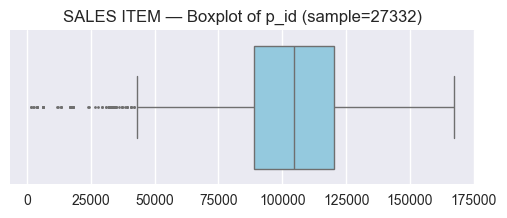

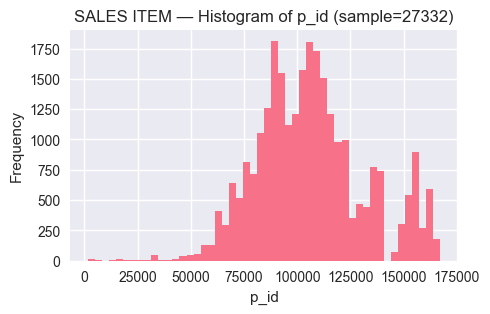

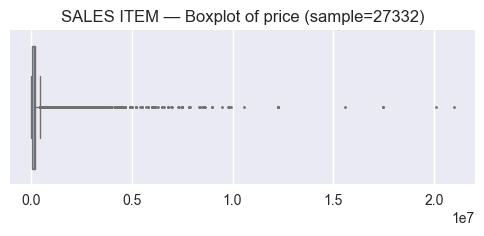

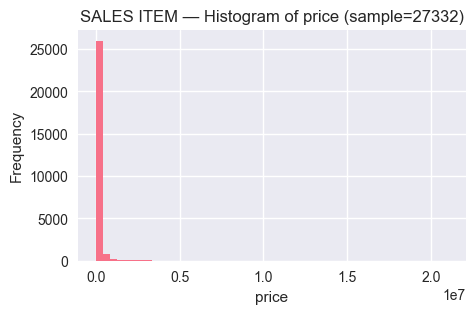

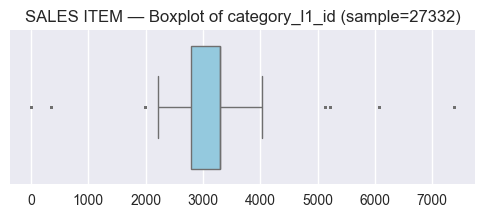

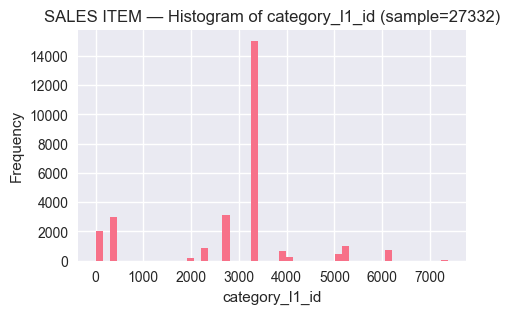


Plotting numeric distributions for SALES PURCHASE ...


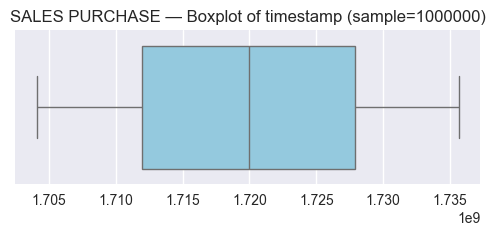

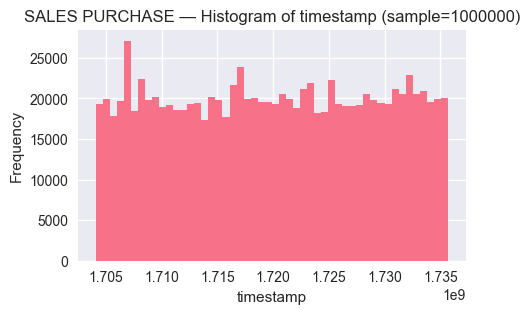

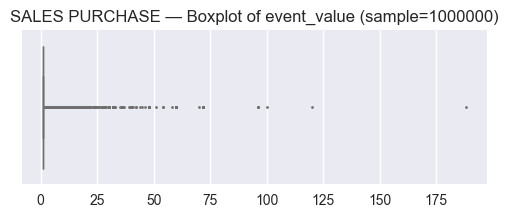

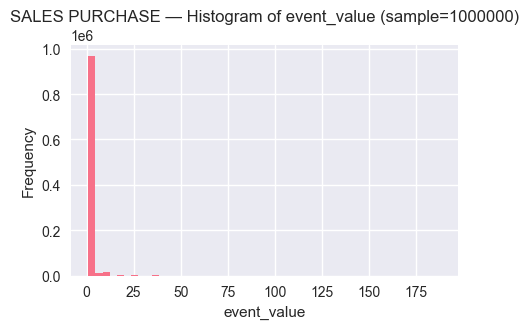

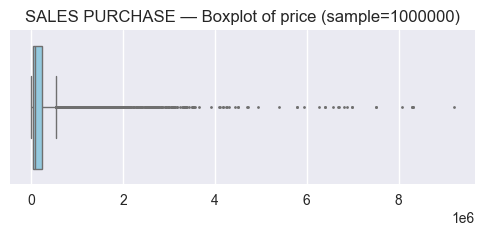

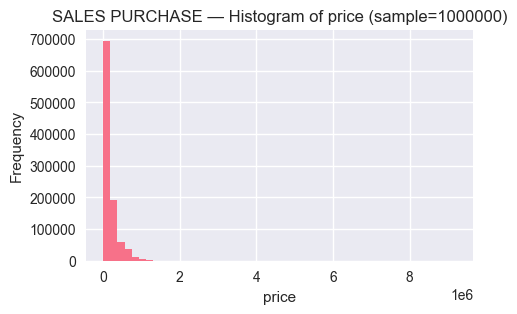


Plotting numeric distributions for SALES USER ...


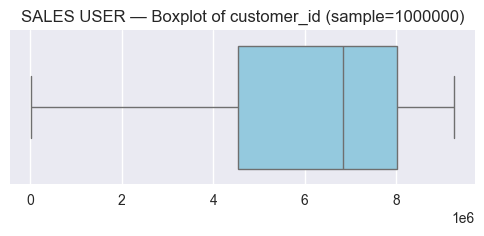

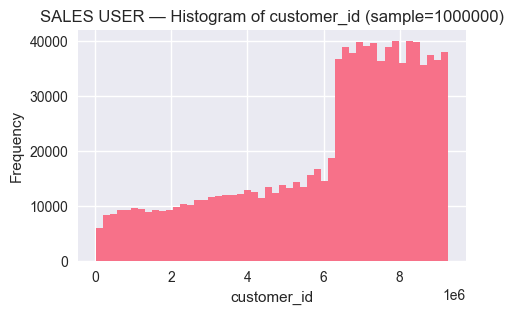

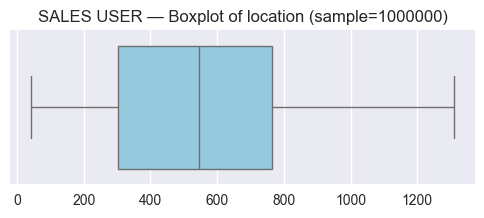

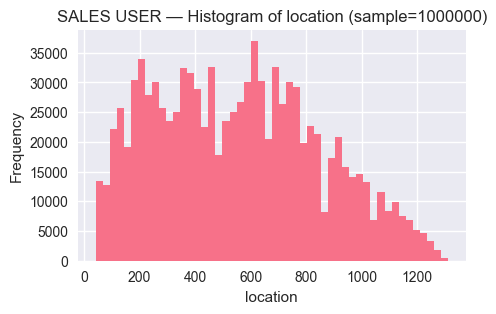

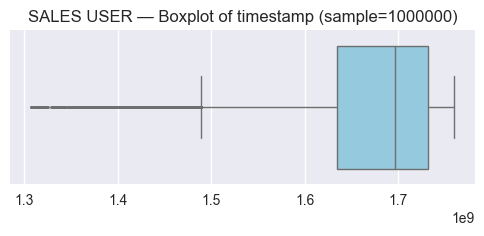

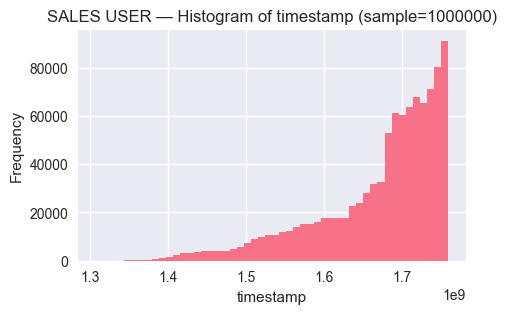

In [19]:
for name, df in datasets.items():
    if df is None:
        continue

    num_cols = [col for col, dtype in zip(df.columns, df.dtypes) if dtype in pl.NUMERIC_DTYPES]
    if not num_cols:
        continue

    print(f"\nPlotting numeric distributions for {name} ...")

    for col in num_cols[:3]:
        sample_size = min(1000000, df.height)
        s = df.select(col).sample(n=sample_size, seed=42)[col].to_numpy()

        plt.figure(figsize=(6, 2))
        sns.boxplot(x=s, color='skyblue', fliersize=1)
        plt.title(f"{name} — Boxplot of {col} (sample={sample_size})")
        plt.show()

        plt.figure(figsize=(5, 3))
        plt.hist(s, bins=50)
        plt.title(f"{name} — Histogram of {col} (sample={sample_size})")
        plt.xlabel(col)
        plt.ylabel("Frequency")
        plt.show()

2. Categorical datatype

In [20]:
def eda_univariate(df: pl.DataFrame, name=""):
    # --- String / Categorical columns ---
    cat_cols = [
        col for col, dtype in zip(df.columns, df.dtypes)
        if dtype in [pl.Utf8, pl.Categorical]
    ]

    if cat_cols:
        print(f"\nCác cột dạng ký tự ({len(cat_cols)}): {cat_cols}")
        for col in cat_cols:
            print(f"\n Cột '{col}' — Top 10 giá trị phổ biến:")
            freq = (
                df[col]
                .drop_nulls()
                .value_counts()
                .sort("count", descending=True)
                .head(10)
            )
            print(freq)

            # --- Vẽ biểu đồ cột ---
            freq_pd = freq.to_pandas()
            plt.figure(figsize=(6, 3))
            plt.bar(freq_pd[col], freq_pd["count"])
            plt.title(f"Top 10 giá trị phổ biến - {col}")
            plt.xlabel(col)
            plt.ylabel("Tần suất")
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()
    else:
        print("Không có cột ký tự.")


Các cột dạng ký tự (19): ['item_id', 'category_l1', 'category_l2', 'category_l3', 'category', 'description', 'brand', 'manufacturer', 'sync_error_message', 'image_url', 'gender_target', 'age_group', 'item_type', 'color', 'size', 'origin', 'volume', 'material', 'description_new']

 Cột 'item_id' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌───────────────┬───────┐
│ item_id       ┆ count │
│ ---           ┆ ---   │
│ str           ┆ u32   │
╞═══════════════╪═══════╡
│ 2089000000023 ┆ 1     │
│ 0815004510011 ┆ 1     │
│ 0851016480003 ┆ 1     │
│ 0987004500002 ┆ 1     │
│ 3500000000004 ┆ 1     │
│ 3989000000007 ┆ 1     │
│ 3321000000002 ┆ 1     │
│ 0008150000053 ┆ 1     │
│ 3951000000111 ┆ 1     │
│ 0887026780001 ┆ 1     │
└───────────────┴───────┘


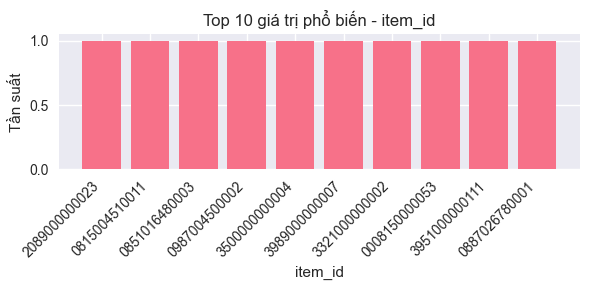


 Cột 'category_l1' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────────────┬───────┐
│ category_l1            ┆ count │
│ ---                    ┆ ---   │
│ str                    ┆ u32   │
╞════════════════════════╪═══════╡
│ Thời trang             ┆ 15042 │
│ Phụ kiện               ┆ 3147  │
│ Đồ chơi & Sách         ┆ 2955  │
│ Babycare               ┆ 1994  │
│ Thực phẩm cho bé       ┆ 981   │
│ Textile                ┆ 555   │
│ Thực phẩm cho gia đình ┆ 470   │
│ Tã                     ┆ 442   │
│ Sữa                    ┆ 437   │
│ Hóa mỹ phẩm gia đình   ┆ 388   │
└────────────────────────┴───────┘


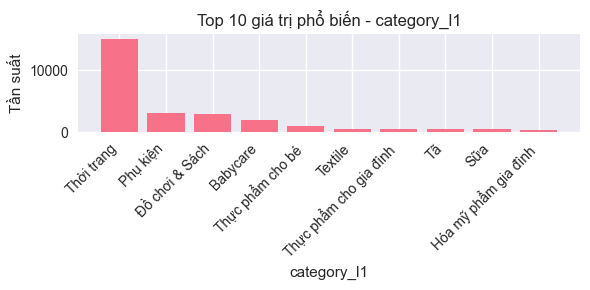


 Cột 'category_l2' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────────────────┬───────┐
│ category_l2                ┆ count │
│ ---                        ┆ ---   │
│ str                        ┆ u32   │
╞════════════════════════════╪═══════╡
│ Cơ cấu hàng cũ             ┆ 9105  │
│ Thời trang bé trai         ┆ 2179  │
│ Thời trang bé gái          ┆ 1887  │
│ Modal kháng khuẩn          ┆ 1711  │
│ 1Y+                        ┆ 1565  │
│ Quần áo & Phụ kiện sơ sinh ┆ 1539  │
│ Sách & VPP                 ┆ 736   │
│ 0-1Y                       ┆ 654   │
│ Giày tập đi                ┆ 555   │
│ Bình sữa, phụ kiện         ┆ 517   │
└────────────────────────────┴───────┘


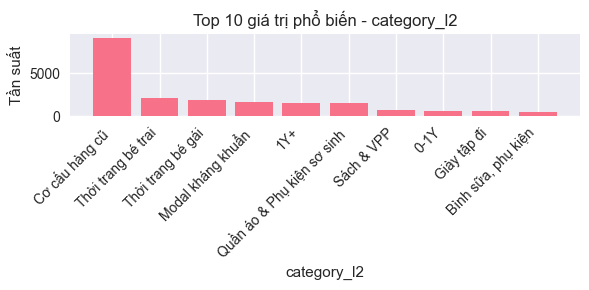


 Cột 'category_l3' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────────────────────┬───────┐
│ category_l3                    ┆ count │
│ ---                            ┆ ---   │
│ str                            ┆ u32   │
╞════════════════════════════════╪═══════╡
│ Thời trang bé trai, bé gái cũ  ┆ 5164  │
│ Quần, áo & phụ kiện sơ sinh cũ ┆ 1763  │
│ Bộ bé trai                     ┆ 1643  │
│ Bộ Modal                       ┆ 1200  │
│ Giày dép tồn                   ┆ 1092  │
│ Bộ bé gái                      ┆ 938   │
│ Sách                           ┆ 610   │
│ Áo                             ┆ 597   │
│ Bodysuit Modal                 ┆ 511   │
│ Đầm bé gái                     ┆ 497   │
└────────────────────────────────┴───────┘


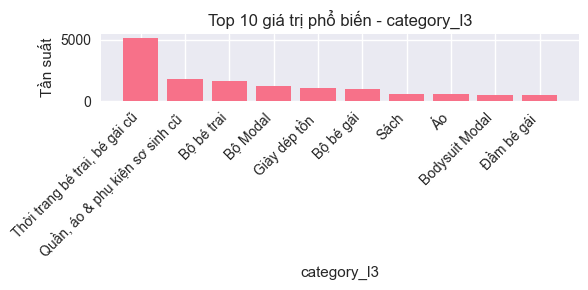


 Cột 'category' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌───────────────────────┬───────┐
│ category              ┆ count │
│ ---                   ┆ ---   │
│ str                   ┆ u32   │
╞═══════════════════════╪═══════╡
│ Bộ bé trai Animo      ┆ 1018  │
│ Bộ quần áo bé gái     ┆ 741   │
│ Bộ Modal lẻ           ┆ 740   │
│ Áo bé gái             ┆ 731   │
│ Bodysuit              ┆ 718   │
│ Áo sơ sinh            ┆ 713   │
│ Bộ bé trai Animo Easy ┆ 625   │
│ Quần sơ sinh          ┆ 618   │
│ Áo bé trai            ┆ 611   │
│ Áo sơ sinh Animo      ┆ 559   │
└───────────────────────┴───────┘


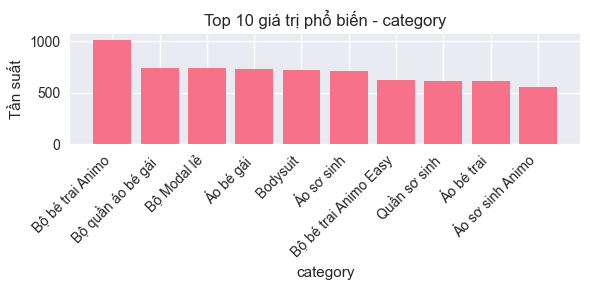


 Cột 'description' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌─────────────────────────────────┬───────┐
│ description                     ┆ count │
│ ---                             ┆ ---   │
│ str                             ┆ u32   │
╞═════════════════════════════════╪═══════╡
│ Không xác định                  ┆ 18629 │
│ Ưu điểm nổi bật của sản phẩm -… ┆ 16    │
│ ﻿ Ưu điểm nổi bật của sản phẩm…  ┆ 8     │
│ - Chuyên dùng cho bé ngậm tạo … ┆ 6     │
│ ﻿ Ưu điểm nổi bật của sản phẩm…  ┆ 6     │
│ Ty bình sữa dành cho bé yêu cầ… ┆ 4     │
│ Ưu điểm nổi bật của sản phẩm V… ┆ 3     │
│ Với Tã dán Pampers Nhật Bản ne… ┆ 3     │
│ - Chuyên dùng cho bé ngậm tạo … ┆ 3     │
│ Với dây đeo an toàn, bé của bạ… ┆ 3     │
└─────────────────────────────────┴───────┘


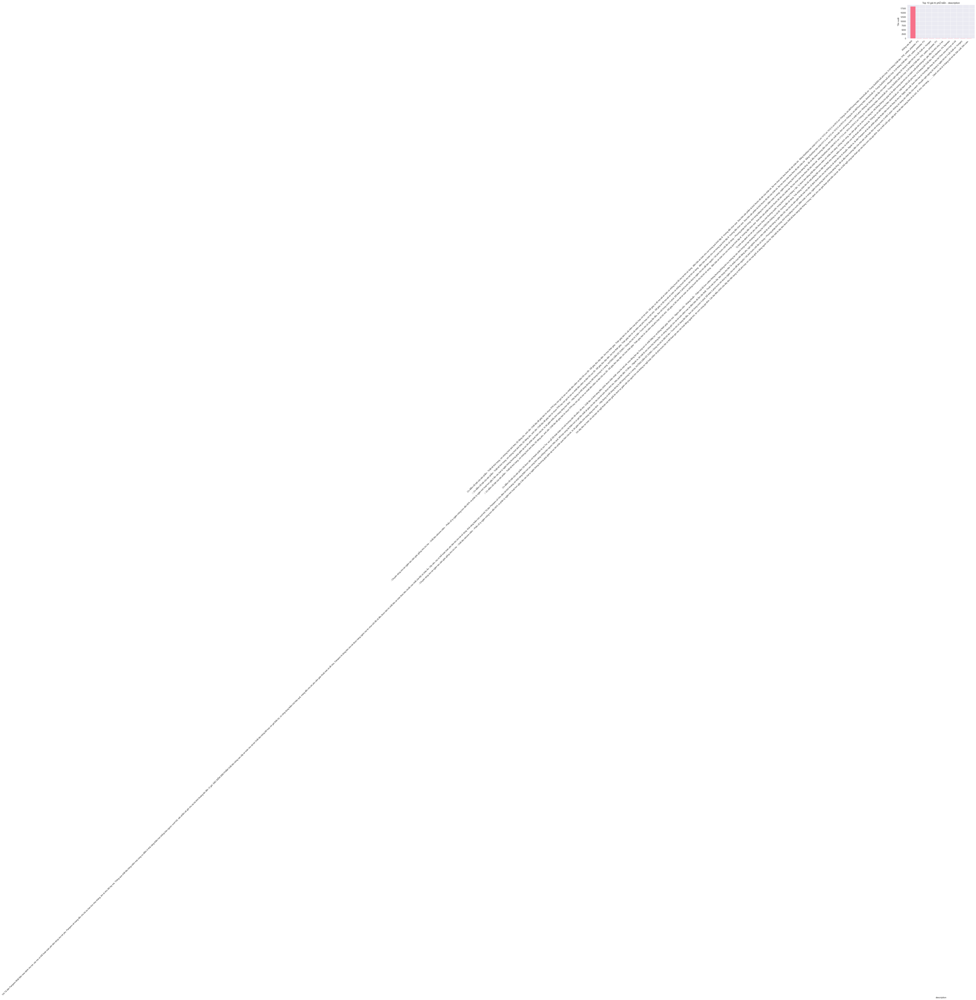


 Cột 'brand' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌──────────────────────┬───────┐
│ brand                ┆ count │
│ ---                  ┆ ---   │
│ str                  ┆ u32   │
╞══════════════════════╪═══════╡
│ Animo                ┆ 8149  │
│ Không xác định       ┆ 5480  │
│ CF (ConCung Fashion) ┆ 5426  │
│ Thương hiệu khác     ┆ 607   │
│ Con Cưng             ┆ 484   │
│ TOYCITY              ┆ 300   │
│ ConCung Good         ┆ 211   │
│ Nous                 ┆ 140   │
│ Pigeon               ┆ 120   │
│ Mesuca               ┆ 114   │
└──────────────────────┴───────┘


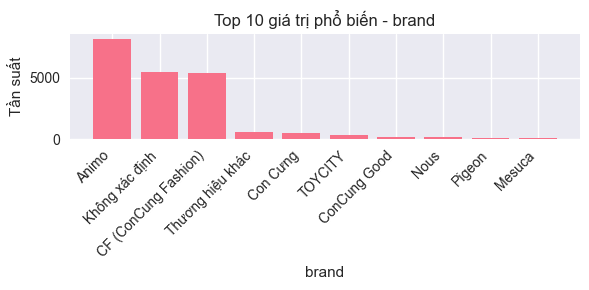


 Cột 'manufacturer' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌─────────────────────────────────┬───────┐
│ manufacturer                    ┆ count │
│ ---                             ┆ ---   │
│ str                             ┆ u32   │
╞═════════════════════════════════╪═══════╡
│ Không xác định                  ┆ 25767 │
│ Unilever                        ┆ 28    │
│ Mead Johnson Nutrition (Thaila… ┆ 20    │
│ Công ty Cổ Phần Thực Phẩm Dinh… ┆ 19    │
│ Vinamilk                        ┆ 17    │
│ Hayat Việt Nam                  ┆ 12    │
│ Australia Deloraine Dairy Pty … ┆ 11    │
│ CÔNG TY CỔ PHẦN SÀI GÒN FOOD -… ┆ 11    │
│ VitaDairy                       ┆ 11    │
│ LONG HAPPY TOYS                 ┆ 11    │
└─────────────────────────────────┴───────┘


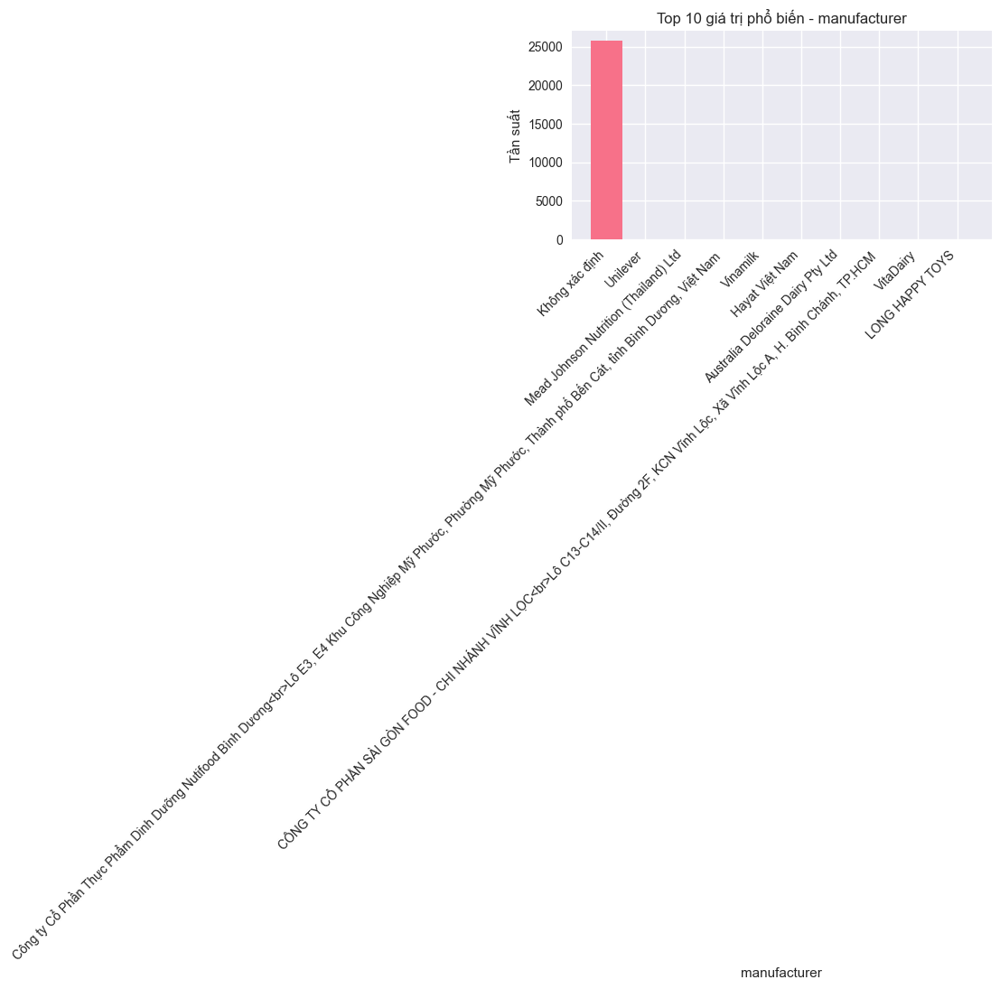


 Cột 'sync_error_message' — Top 10 giá trị phổ biến:
shape: (0, 2)
┌────────────────────┬───────┐
│ sync_error_message ┆ count │
│ ---                ┆ ---   │
│ str                ┆ u32   │
╞════════════════════╪═══════╡
└────────────────────┴───────┘


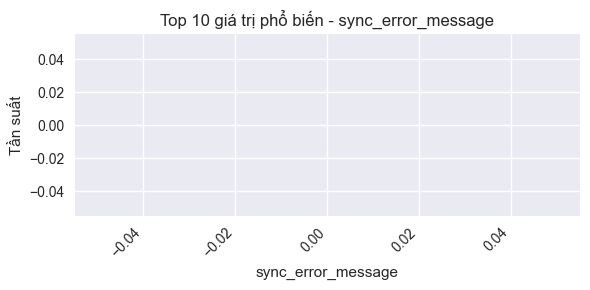


 Cột 'image_url' — Top 10 giá trị phổ biến:
shape: (1, 2)
┌────────────────┬───────┐
│ image_url      ┆ count │
│ ---            ┆ ---   │
│ str            ┆ u32   │
╞════════════════╪═══════╡
│ Không xác định ┆ 27332 │
└────────────────┴───────┘


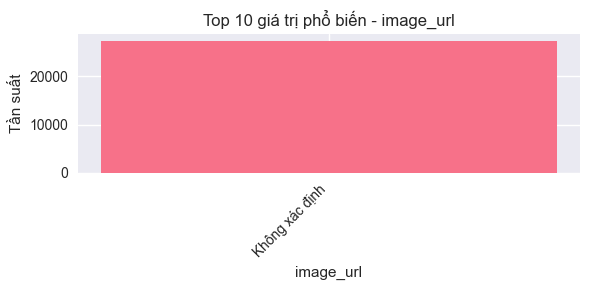


 Cột 'gender_target' — Top 10 giá trị phổ biến:
shape: (5, 2)
┌────────────────┬───────┐
│ gender_target  ┆ count │
│ ---            ┆ ---   │
│ str            ┆ u32   │
╞════════════════╪═══════╡
│ Không xác định ┆ 18038 │
│ Bé Gái         ┆ 4108  │
│ Bé Trai        ┆ 3318  │
│ Sơ sinh        ┆ 1862  │
│ Unisex         ┆ 6     │
└────────────────┴───────┘


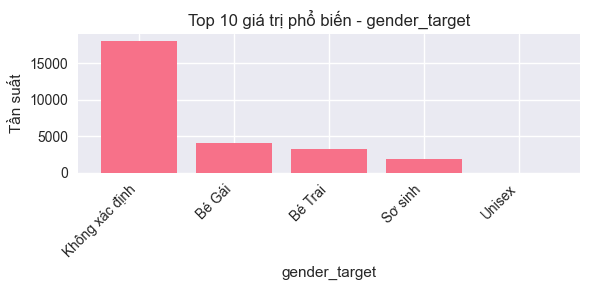


 Cột 'age_group' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────┬───────┐
│ age_group      ┆ count │
│ ---            ┆ ---   │
│ str            ┆ u32   │
╞════════════════╪═══════╡
│ Không xác định ┆ 15812 │
│ Từ 3Y          ┆ 944   │
│ 9M-12M         ┆ 844   │
│ 6M-9M          ┆ 672   │
│ Từ 1Y          ┆ 609   │
│ Từ 2Y          ┆ 577   │
│ 3M-6M          ┆ 545   │
│ Từ 6M          ┆ 508   │
│ 0-12M          ┆ 431   │
│ Từ 0M          ┆ 430   │
└────────────────┴───────┘


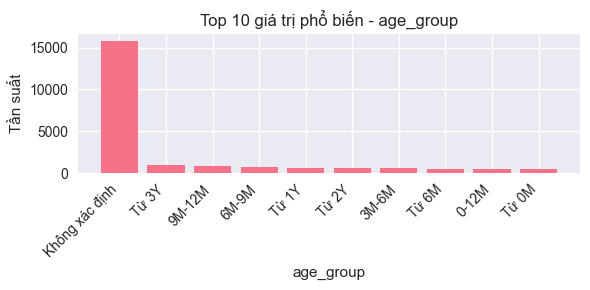


 Cột 'item_type' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌──────────────────────┬───────┐
│ item_type            ┆ count │
│ ---                  ┆ ---   │
│ str                  ┆ u32   │
╞══════════════════════╪═══════╡
│ Không xác định       ┆ 9820  │
│ Bộ quần áo           ┆ 3926  │
│ Áo                   ┆ 1904  │
│ Bodysuit             ┆ 1456  │
│ Quần                 ┆ 990   │
│ Giày tập đi          ┆ 764   │
│ Đầm, váy             ┆ 708   │
│ Nón                  ┆ 385   │
│ Sữa bột cho bé       ┆ 351   │
│ Bánh, kẹo dinh dưỡng ┆ 350   │
└──────────────────────┴───────┘


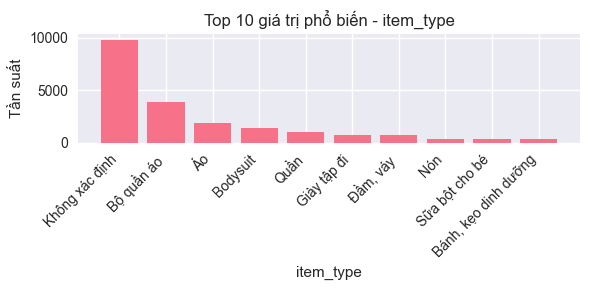


 Cột 'color' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────┬───────┐
│ color          ┆ count │
│ ---            ┆ ---   │
│ str            ┆ u32   │
╞════════════════╪═══════╡
│ Không xác định ┆ 26608 │
│ Xanh           ┆ 165   │
│ Hồng           ┆ 164   │
│ Trắng          ┆ 81    │
│ Vàng           ┆ 48    │
│ Nhiều màu      ┆ 40    │
│ Đỏ             ┆ 34    │
│ Xám            ┆ 31    │
│ Xanh dương     ┆ 21    │
│ Cam            ┆ 14    │
└────────────────┴───────┘


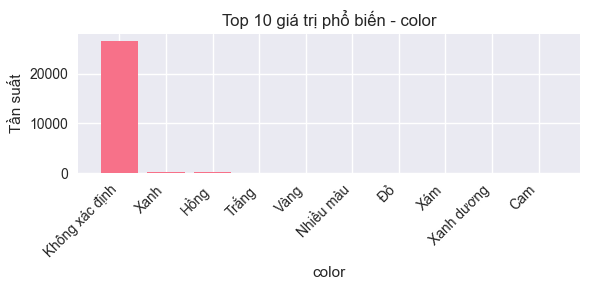


 Cột 'size' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────┬───────┐
│ size           ┆ count │
│ ---            ┆ ---   │
│ str            ┆ u32   │
╞════════════════╪═══════╡
│ Không xác định ┆ 25108 │
│ 0-3M           ┆ 346   │
│ 1Y             ┆ 330   │
│ 6-9M           ┆ 224   │
│ 9 tháng        ┆ 112   │
│ NB             ┆ 112   │
│ 13             ┆ 98    │
│ 1-2Y           ┆ 70    │
│ 3-6M           ┆ 53    │
│ 9-12M          ┆ 51    │
└────────────────┴───────┘


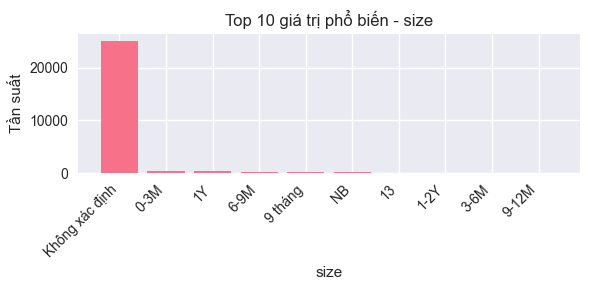


 Cột 'origin' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────────┬───────┐
│ origin             ┆ count │
│ ---                ┆ ---   │
│ str                ┆ u32   │
╞════════════════════╪═══════╡
│ Không xác định     ┆ 22627 │
│ Việt Nam           ┆ 1991  │
│ Trung Quốc         ┆ 584   │
│ Hàn Quốc           ┆ 216   │
│ Việt Nam, Việt Nam ┆ 190   │
│ Nhật Bản           ┆ 175   │
│ Nhật Bản, Nhật Bản ┆ 171   │
│ Thái Lan           ┆ 141   │
│ Úc                 ┆ 61    │
│ Singapore          ┆ 49    │
└────────────────────┴───────┘


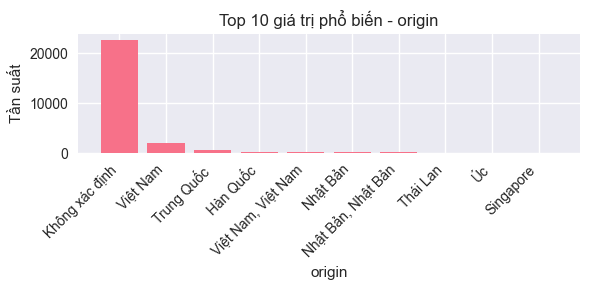


 Cột 'volume' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────┬───────┐
│ volume         ┆ count │
│ ---            ┆ ---   │
│ str            ┆ u32   │
╞════════════════╪═══════╡
│ Không xác định ┆ 26973 │
│ 500ml          ┆ 24    │
│ 200ml          ┆ 18    │
│ 100ml          ┆ 18    │
│ 110ml x 4 hộp  ┆ 16    │
│ 250ml          ┆ 15    │
│ 180ml x 4 hộp  ┆ 13    │
│ 30ml           ┆ 11    │
│ 150ml          ┆ 10    │
│ 105ml          ┆ 9     │
└────────────────┴───────┘


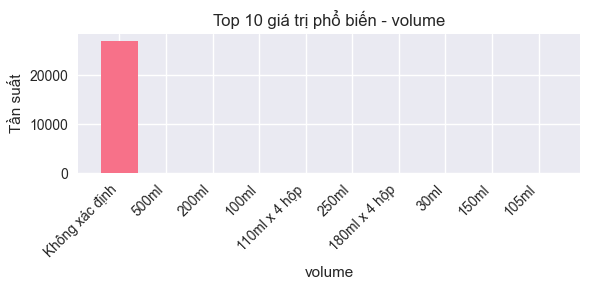


 Cột 'material' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌─────────────────────────────────┬───────┐
│ material                        ┆ count │
│ ---                             ┆ ---   │
│ str                             ┆ u32   │
╞═════════════════════════════════╪═══════╡
│ Không xác định                  ┆ 24664 │
│ 100% cotton                     ┆ 454   │
│ Cotton, Polyester               ┆ 227   │
│ Nhựa ABS                        ┆ 142   │
│ Nhựa PP                         ┆ 107   │
│ 100% Cotton                     ┆ 60    │
│ 100% cotton, 150gsm             ┆ 42    │
│ 95% modal, 5% spandex           ┆ 37    │
│ Vải nhân tạo, Bông nhân tạo (1… ┆ 28    │
│ Nhựa EVA                        ┆ 28    │
└─────────────────────────────────┴───────┘


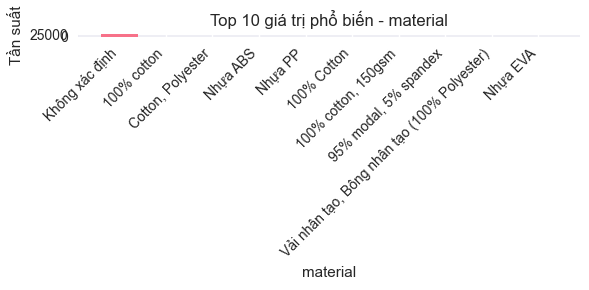


 Cột 'description_new' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌─────────────────────────────────┬───────┐
│ description_new                 ┆ count │
│ ---                             ┆ ---   │
│ str                             ┆ u32   │
╞═════════════════════════════════╪═══════╡
│ Không xác định                  ┆ 12815 │
│ Chi tiết sản phẩmTên sản phẩm:… ┆ 2     │
│ Chi tiết sản phẩmTên sản phẩm:… ┆ 2     │
│ Chi tiết sản phẩm             … ┆ 1     │
│ Chi tiết sản phẩmTên sản phẩm:… ┆ 1     │
│ Chi tiết sản phẩm             … ┆ 1     │
│ Chi tiết sản phẩm             … ┆ 1     │
│ Chi tiết sản phẩm             … ┆ 1     │
│ Chi tiết sản phẩm             … ┆ 1     │
│ Chi tiết sản phẩm             … ┆ 1     │
└─────────────────────────────────┴───────┘



Các cột dạng ký tự (5): ['user_id', 'item_id', 'event_type', 'channel', 'payment']

 Cột 'user_id' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌─────────────────────────────────┬───────┐
│ user_id                         ┆ count │
│ ---                             ┆ ---   │
│ str                             ┆ u32   │
╞═════════════════════════════════╪═══════╡
│ 7f1ad828d8fd0bf64642908060fe5c… ┆ 893   │
│ b6d309d61deb6bd8691562b64d629e… ┆ 838   │
│ ec44b0821fc75180c9d7da38ec3095… ┆ 793   │
│ 0c81f44235a594fc21b7836b594785… ┆ 779   │
│ 298e48063d145d09c704170bde7fd9… ┆ 776   │
│ a397ba885dbecb3aa25bd1a86b73c7… ┆ 771   │
│ b7de4d50bfdd7cd9313171e762ce9e… ┆ 748   │
│ af9e01cd280c6e09f99c0a9177c610… ┆ 746   │
│ a2d3b350fb1bebffacb2d80d7d75dc… ┆ 719   │
│ 4a6094488155e6255f7e51fcfffbf8… ┆ 707   │
└─────────────────────────────────┴───────┘


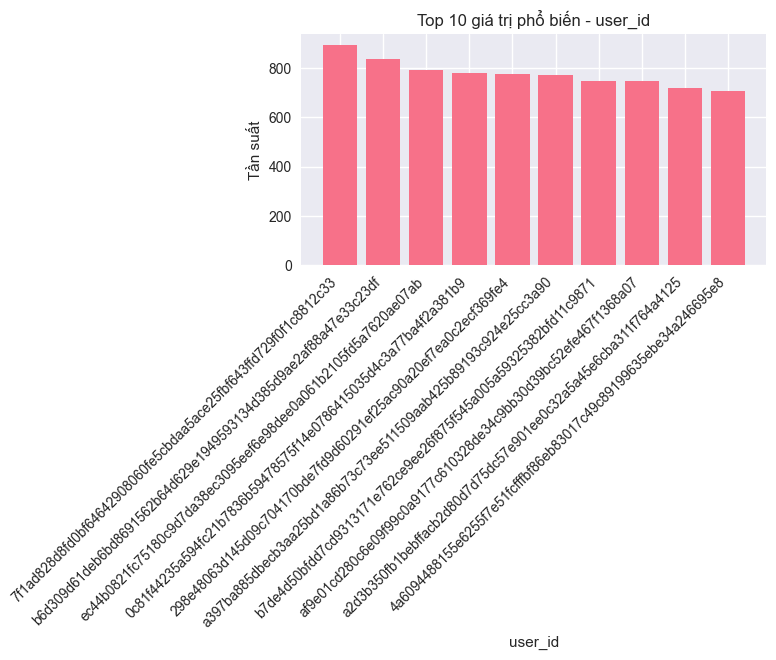


 Cột 'item_id' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌───────────────┬────────┐
│ item_id       ┆ count  │
│ ---           ┆ ---    │
│ str           ┆ u32    │
╞═══════════════╪════════╡
│ 1512000000004 ┆ 302740 │
│ 2803000000013 ┆ 224091 │
│ 0020010000438 ┆ 206507 │
│ 4690000000001 ┆ 197920 │
│ 2803000000011 ┆ 185810 │
│ 5950000000001 ┆ 179824 │
│ 6768000000005 ┆ 157294 │
│ 3773000000004 ┆ 156513 │
│ 6768000000004 ┆ 153043 │
│ 2803000000012 ┆ 151524 │
└───────────────┴────────┘


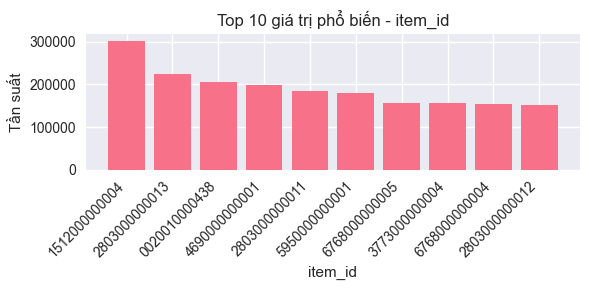


 Cột 'event_type' — Top 10 giá trị phổ biến:
shape: (1, 2)
┌────────────┬──────────┐
│ event_type ┆ count    │
│ ---        ┆ ---      │
│ str        ┆ u32      │
╞════════════╪══════════╡
│ Purchase   ┆ 35729825 │
└────────────┴──────────┘


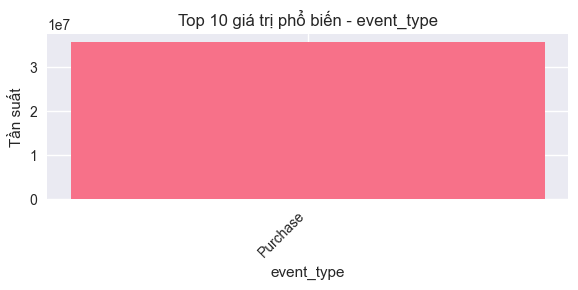


 Cột 'channel' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────┬──────────┐
│ channel        ┆ count    │
│ ---            ┆ ---      │
│ str            ┆ u32      │
╞════════════════╪══════════╡
│ In-Store       ┆ 33016358 │
│ iOS            ┆ 1397128  │
│ SPE            ┆ 602896   │
│ Android        ┆ 483885   │
│ Web            ┆ 146401   │
│ Call           ┆ 63924    │
│ CRM Partner    ┆ 16640    │
│ Chat           ┆ 2310     │
│ Wholesale      ┆ 162      │
│ Không xác định ┆ 119      │
└────────────────┴──────────┘


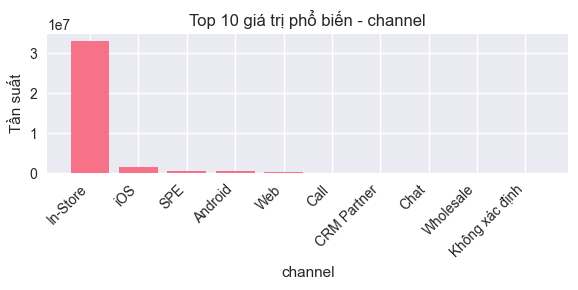


 Cột 'payment' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────┬──────────┐
│ payment        ┆ count    │
│ ---            ┆ ---      │
│ str            ┆ u32      │
╞════════════════╪══════════╡
│ Tiền mặt       ┆ 22454572 │
│ VietQR         ┆ 5766946  │
│ Cà thẻ         ┆ 4040302  │
│ VNPay          ┆ 2080460  │
│ MoMo           ┆ 747996   │
│ Không xác định ┆ 331952   │
│ ZaloPay        ┆ 242983   │
│ ShopeePay      ┆ 45508    │
│ Kredivo        ┆ 19044    │
│ Chuyển khoản   ┆ 62       │
└────────────────┴──────────┘


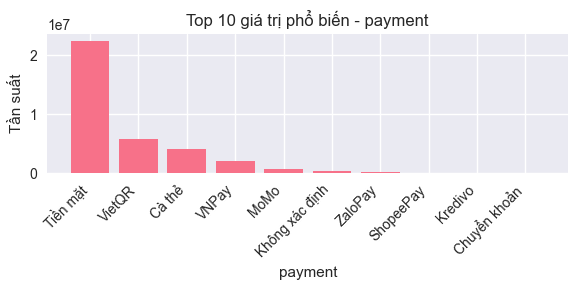


Các cột dạng ký tự (9): ['gender', 'province', 'membership', 'sync_error_message', 'region', 'location_name', 'install_app', 'district', 'user_id']

 Cột 'gender' — Top 10 giá trị phổ biến:
shape: (3, 2)
┌────────┬─────────┐
│ gender ┆ count   │
│ ---    ┆ ---     │
│ str    ┆ u32     │
╞════════╪═════════╡
│ Nữ     ┆ 3424887 │
│ Nam    ┆ 1149069 │
│ Khác   ┆ 8       │
└────────┴─────────┘


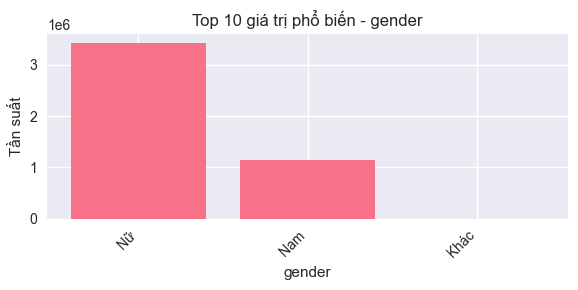


 Cột 'province' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌───────────────────┬─────────┐
│ province          ┆ count   │
│ ---               ┆ ---     │
│ str               ┆ u32     │
╞═══════════════════╪═════════╡
│ Hồ Chí Minh       ┆ 1223333 │
│ Đồng Nai          ┆ 312131  │
│ Bình Dương        ┆ 287542  │
│ Hà Nội            ┆ 201491  │
│ Đà Nẵng           ┆ 146596  │
│ Lâm Đồng          ┆ 134620  │
│ Long An           ┆ 133752  │
│ Bà Rịa - Vũng Tàu ┆ 118101  │
│ Khánh Hòa         ┆ 112897  │
│ Tây Ninh          ┆ 112150  │
└───────────────────┴─────────┘


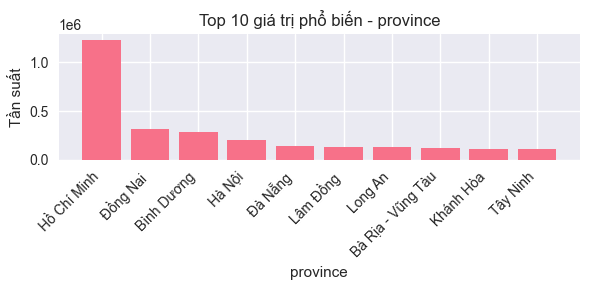


 Cột 'membership' — Top 10 giá trị phổ biến:
shape: (3, 2)
┌────────────┬─────────┐
│ membership ┆ count   │
│ ---        ┆ ---     │
│ str        ┆ u32     │
╞════════════╪═════════╡
│ Standard   ┆ 4242946 │
│ Gold       ┆ 255173  │
│ Diamond    ┆ 75845   │
└────────────┴─────────┘


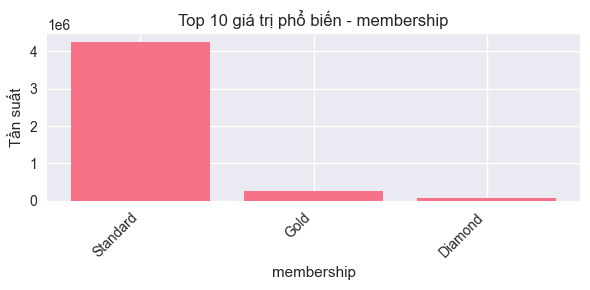


 Cột 'sync_error_message' — Top 10 giá trị phổ biến:
shape: (0, 2)
┌────────────────────┬───────┐
│ sync_error_message ┆ count │
│ ---                ┆ ---   │
│ str                ┆ u32   │
╞════════════════════╪═══════╡
└────────────────────┴───────┘


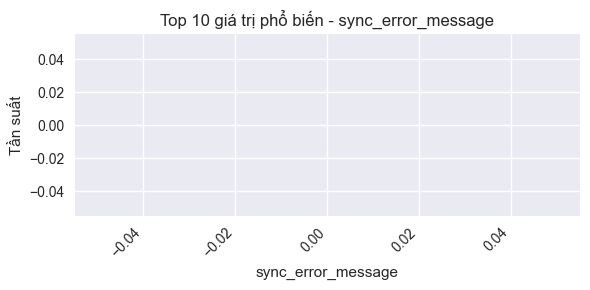


 Cột 'region' — Top 10 giá trị phổ biến:
shape: (8, 2)
┌───────────────────────────────┬─────────┐
│ region                        ┆ count   │
│ ---                           ┆ ---     │
│ str                           ┆ u32     │
╞═══════════════════════════════╪═════════╡
│ Đông Nam Bộ                   ┆ 2126066 │
│ Đồng bằng sông Cửu Long       ┆ 847970  │
│ Duyên hải Nam Trung Bộ        ┆ 577306  │
│ Đồng bằng sông Hồng           ┆ 361571  │
│ Tây Nguyên                    ┆ 333463  │
│ Bắc Trung Bộ                  ┆ 217869  │
│ Trung du và miền núi phía Bắc ┆ 105336  │
│ Duyên hải Bắc Bộ              ┆ 4383    │
└───────────────────────────────┴─────────┘


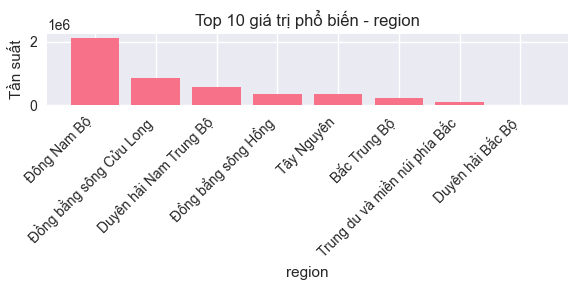


 Cột 'location_name' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌───────────────────────────────┬───────┐
│ location_name                 ┆ count │
│ ---                           ┆ ---   │
│ str                           ┆ u32   │
╞═══════════════════════════════╪═══════╡
│ DNA - 81 - 83 Nguyễn Văn Linh ┆ 22383 │
│ HNI - Aeon Mall Hà Đông       ┆ 21746 │
│ HCM - 66 Nguyễn Du            ┆ 21509 │
│ HNI - 933 La Thành            ┆ 20835 │
│ HCM - 9 – 11 – 13 Nguyễn Trãi ┆ 20563 │
│ DNA - 93-95 Lê Văn Hiến       ┆ 19558 │
│ HNI - 16B-4 Nguyễn Văn Lộc    ┆ 17538 │
│ HNI - 147K Đội Cấn            ┆ 16810 │
│ TVI - 62 Điện Biên Phủ        ┆ 16696 │
│ VLO - 47- 49 Trưng Nữ Vương   ┆ 16658 │
└───────────────────────────────┴───────┘


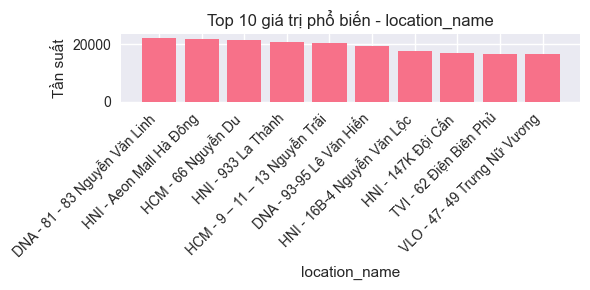


 Cột 'install_app' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────────┬─────────┐
│ install_app    ┆ count   │
│ ---            ┆ ---     │
│ str            ┆ u32     │
╞════════════════╪═════════╡
│ In-Store       ┆ 3942000 │
│ SPE            ┆ 347908  │
│ iOS            ┆ 127882  │
│ Android        ┆ 91951   │
│ Web            ┆ 35876   │
│ CRM Partner    ┆ 15992   │
│ Call           ┆ 10584   │
│ Chat           ┆ 1727    │
│ Wholesale      ┆ 38      │
│ Không xác định ┆ 5       │
└────────────────┴─────────┘


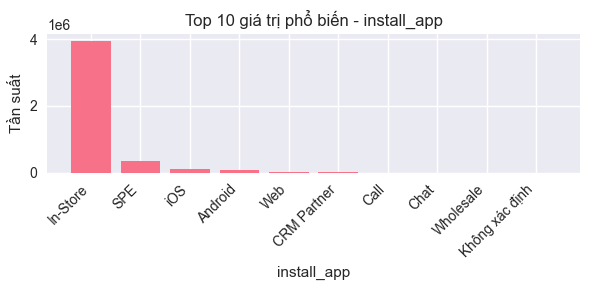


 Cột 'district' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌────────────┬────────┐
│ district   ┆ count  │
│ ---        ┆ ---    │
│ str        ┆ u32    │
╞════════════╪════════╡
│ Thủ Đức    ┆ 195601 │
│ Biên Hòa   ┆ 125390 │
│ Bình Tân   ┆ 105858 │
│ Tân Phú    ┆ 102835 │
│ Bình Chánh ┆ 84427  │
│ 12         ┆ 81984  │
│ Thuận An   ┆ 71387  │
│ 1          ┆ 65854  │
│ Gò Vấp     ┆ 65727  │
│ 7          ┆ 65561  │
└────────────┴────────┘


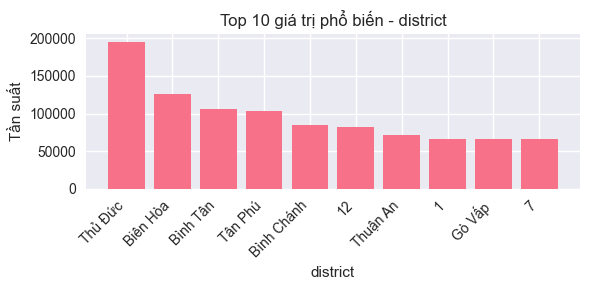


 Cột 'user_id' — Top 10 giá trị phổ biến:
shape: (10, 2)
┌─────────────────────────────────┬───────┐
│ user_id                         ┆ count │
│ ---                             ┆ ---   │
│ str                             ┆ u32   │
╞═════════════════════════════════╪═══════╡
│ 6b59eadc3e8a83943badab63014ab4… ┆ 1     │
│ c9e8bcfae9eed8cd23c67f1cd21cc7… ┆ 1     │
│ 6156582b0b4deeda29f007d589fd4c… ┆ 1     │
│ 6a127eb95c713d54c32881d4384263… ┆ 1     │
│ 1f38bff9dc48e123132dca4898375b… ┆ 1     │
│ f44b56907395935e08cf27d608adcc… ┆ 1     │
│ 9feeb1395fa0747184a764d1712e17… ┆ 1     │
│ 4415962d415ef811ab0b28abf96fca… ┆ 1     │
│ fc1adec19343e1555308608d007deb… ┆ 1     │
│ 77955ed2fae2d0f832276dc16a2a37… ┆ 1     │
└─────────────────────────────────┴───────┘


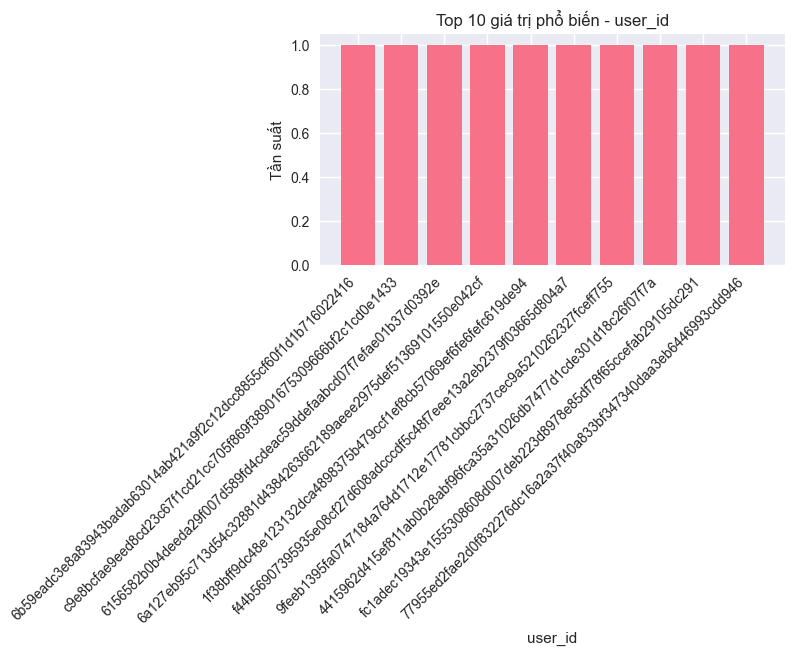

In [21]:
eda_univariate(sales_item_df, "sales_pers.item")
eda_univariate(sales_purchase_df, "sales_pers.purchase")
eda_univariate(sales_user_df, "sales_pers.user")

PHẦN 3 — EDA Đa biến (Bivariate Analysis)


=== Bivariate (numeric vs numeric): SALES ITEM ===


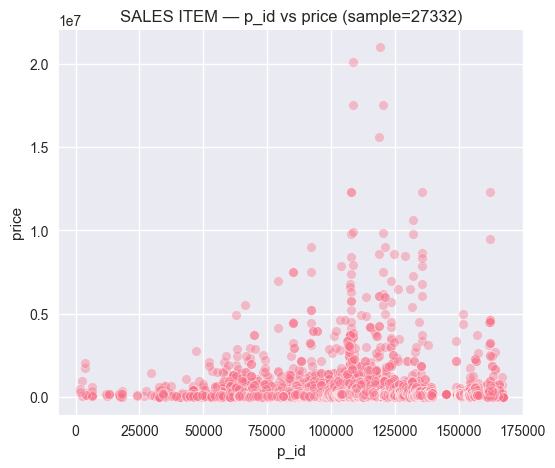

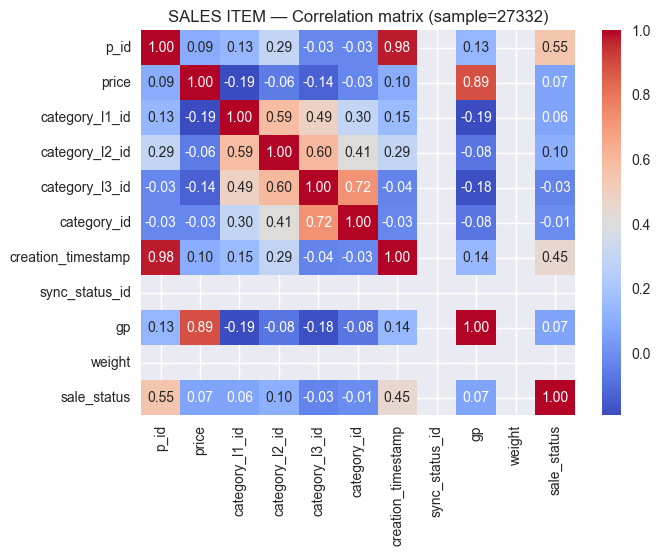


=== Bivariate (numeric vs numeric): SALES PURCHASE ===


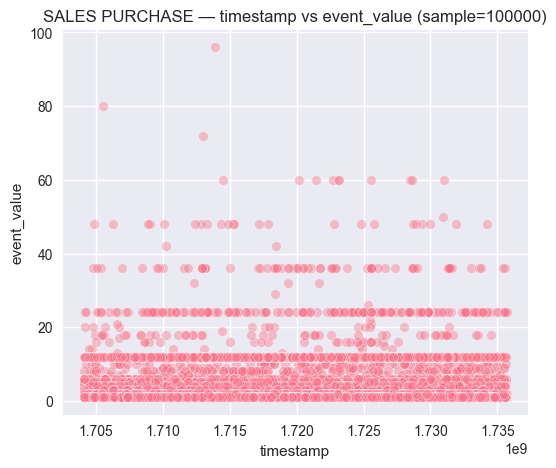

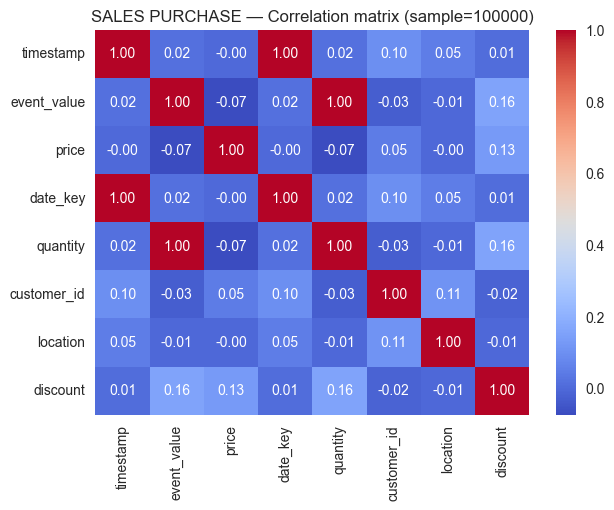


=== Bivariate (numeric vs numeric): SALES USER ===


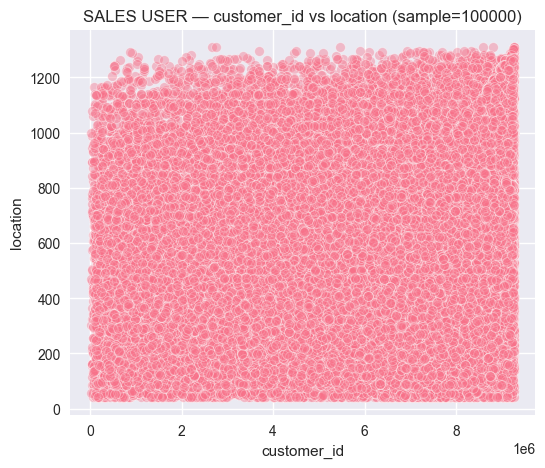

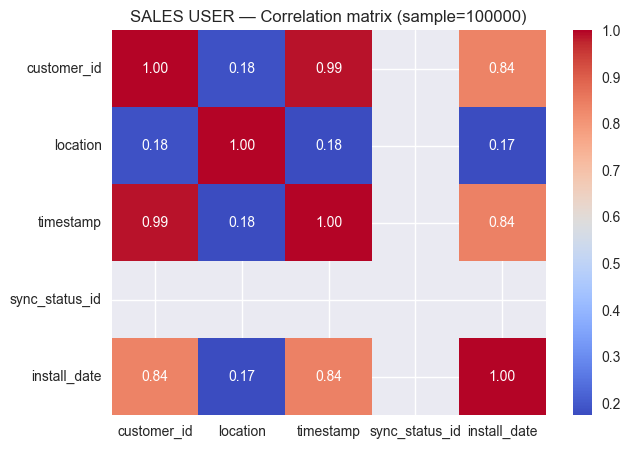

In [22]:
for name, df in datasets.items():
    if df is None:
        continue
    print(f"\n=== Bivariate (numeric vs numeric): {name} ===")

    # --- Lấy các cột numeric ---
    num_cols = [col for col, dtype in zip(df.columns, df.dtypes) if dtype in pl.NUMERIC_DTYPES]
    if len(num_cols) < 2:
        print("Không đủ 2 biến số để so sánh.")
        continue

    # --- Lấy mẫu an toàn ---
    sample_size = min(100_000, df.height)
    df_sample = df.sample(n=sample_size, seed=42, with_replacement=False)

    # --- Chọn 2 cột đầu tiên ---
    col_x, col_y = num_cols[:2]

    # --- Chuyển 2 cột sang pandas ---
    s_x = df_sample[col_x].drop_nulls().to_pandas()
    s_y = df_sample[col_y].drop_nulls().to_pandas()

    # --- Scatter plot ---
    plt.figure(figsize=(6, 5))
    sns.scatterplot(x=s_x, y=s_y, alpha=0.4)
    plt.title(f"{name} — {col_x} vs {col_y} (sample={sample_size})")
    plt.show()

    # --- Ma trận tương quan ---
    corr = df_sample.select(num_cols).to_pandas().corr()
    plt.figure(figsize=(7, 5))
    sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title(f"{name} — Correlation matrix (sample={sample_size})")
    plt.show()


Task 3

1. Các trường như id, timestamp, sync_error_message, image_url, even_type, description,... chứa những thông tin định danh hoặc không cần thiết cho việc training -> cần loại bỏ
2. Từ việc EDA ta thấy trường weights, manufacturer, color, size, volume,... thiếu rất nhiều dữ liệu, cần xử lí NULL
3. Các trường như price thường là trường thường xuyên có outlier
4. 